# Overview

This study is an Explainable AI (XAI) approach to analyzing oxygen evolution reaction (OER) of (Ni-Fe-
Co-Ce)Ox catalysts.

The main data set used in this study is from the experimental data of [Haber et al. (2014)](https://pubs.rsc.org/en/content/articlelanding/2014/ee/c3ee43683g).

## Data Preparation
Load the Oxygen-evolution reaction data from *Haber et al. (2013), Discovering Ce-rich oxygen evolution catalysts, from high throughput screening to water electrolysis* \[[supplementary file](https://www.rsc.org/suppdata/ee/c3/c3ee43683g/c3ee43683g.pdf)\].

In [1]:
%%capture
# !pip install "notebook>=5.3" "ipywidgets>=7.5"
!pip install plotly
!pip install kaleido
!pip install shap  
!pip install yellowbrick
!pip install dtreeviz

In [2]:
import plotly.io as pio
pio.renderers.default = 'jupyterlab' # or 'notebook' or 'colab' or 'jupyterlab'

In [3]:
# -------------------------------------
# Library configuration
# -------------------------------------
# Standard libraries
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.offline as pyo
import plotly.io as pio
import plotly.graph_objects as go

# Settings
random_state = 42
plt.style.use('default')
pyo.init_notebook_mode(connected=True)
pio.renderers.default = 'notebook'

pal_plotly = ['#e58606', '#5d69b1', '#52bca3', '#99c945', '#cc61b0', '#24796c', '#daa51b', '#308ac4', '#764e9f', '#ed645a', '#a5aa99']
c = {'Train':pal_plotly[1], 'Test':pal_plotly[0], 
     'Ni':pal_plotly[6], 'Fe':pal_plotly[7], 'Co':pal_plotly[8], 'Ce':pal_plotly[9], 'OVP':pal_plotly[10]} 

# -------------------------------------
# Data configuration
# -------------------------------------
# Define features and target
features = ['Ni', 'Fe', 'Co', 'Ce']
target = ['OVP_10']

# Read data set
df = pd.read_csv('data/OVP_Haber.csv')
df = df.drop(columns=['OVP_3', 'Set'])

print("Data set statistics")
df.describe()

Data set statistics


,Ni,Fe,Co,Ce,OVP_10
count,5413.000000,5413.000000,5413.000000,5413.000000,5413.000000
mean,0.250144,0.251195,0.250260,0.249188,421.113431
std,0.205502,0.206314,0.205794,0.205145,14.969446
min,0.000000,0.000000,0.000000,0.000000,206.000000
25%,0.071000,0.071000,0.071000,0.071000,411.000000
50%,0.200000,0.200000,0.200000,0.200000,419.000000
75%,0.369000,0.369000,0.369000,0.369000,429.000000
max,1.000000,1.000000,1.000000,1.000000,498.000000


In [17]:
# Calculate the variance for a specific column
variance = df['OVP_10'].var()
print('Variance:', variance)

# Calculate the standard deviation for a specific column
std_dev = df['OVP_10'].std()
print('Std:', std_dev)

# Calculate the skewness for a specific column
skewness = df['OVP_10'].skew()
print('Skewness:', skewness)

# Calculate the correlation matrix for all numeric columns
correlation_matrix = df.corr()
print('Correlation:', correlation_matrix)

# Display the frequency distribution of a specific column
freq_distribution = df['OVP_10'].value_counts()
print('Freq distribution:', freq_distribution)

Variance: 224.08432254124193
Std: 14.969446300422803
Skewness: -0.41529119084132815
Correlation:               Ni        Fe        Co        Ce    OVP_10
Ni      1.000000 -0.334332 -0.333799 -0.330495 -0.515117
Fe     -0.334332  1.000000 -0.335085 -0.334421  0.113430
Co     -0.333799 -0.335085  1.000000 -0.331467  0.011325
Ce     -0.330495 -0.334421 -0.331467  1.000000  0.390368
OVP_10 -0.515117  0.113430  0.011325  0.390368  1.000000
Freq distribution: OVP_10
414    197
413    183
412    171
417    167
420    155
      ... 
390      1
473      1
474      1
327      1
252      1
Name: count, Length: 105, dtype: int64


Note: the data set contains 5413 samples as opposed to the 5456 reported [Haber et al. (2014)](https://pubs.rsc.org/en/content/articlelanding/2014/ee/c3ee43683g). This is because the *"data values are not reported for a small fraction of the samples because data quality was insufficient to robustly extract an overpotential or the overpotential was above an imposed compliance voltage of 500 mV"* [Haber et al. (2014, supplementary)](https://pubs.rsc.org/en/content/articlelanding/2014/ee/c3ee43683g).

In [18]:
# Print unique values in each feature
print("Unique values")
for column_name in df[features]:
    unique_values = sorted(df[column_name].unique())
    print(f"\n{column_name}: {unique_values}")

Unique values

Ni: [0.0, 0.031, 0.071, 0.102, 0.129, 0.169, 0.2, 0.231, 0.271, 0.302, 0.329, 0.369, 0.4, 0.431, 0.471, 0.498, 0.529, 0.569, 0.6, 0.631, 0.671, 0.702, 0.729, 0.769, 0.8, 0.831, 0.871, 0.898, 0.929, 0.969, 1.0]

Fe: [0.0, 0.031, 0.071, 0.102, 0.129, 0.169, 0.2, 0.231, 0.271, 0.302, 0.329, 0.369, 0.4, 0.431, 0.471, 0.498, 0.529, 0.569, 0.6, 0.631, 0.671, 0.702, 0.729, 0.769, 0.8, 0.831, 0.871, 0.898, 0.929, 0.969, 1.0]

Co: [0.0, 0.031, 0.071, 0.102, 0.129, 0.169, 0.2, 0.231, 0.271, 0.302, 0.329, 0.369, 0.4, 0.431, 0.471, 0.498, 0.529, 0.569, 0.6, 0.631, 0.671, 0.702, 0.729, 0.769, 0.8, 0.831, 0.871, 0.898, 0.929, 0.969, 1.0]

Ce: [0.0, 0.031, 0.071, 0.102, 0.129, 0.169, 0.2, 0.231, 0.271, 0.302, 0.329, 0.369, 0.4, 0.431, 0.471, 0.498, 0.529, 0.569, 0.6, 0.631, 0.671, 0.702, 0.729, 0.769, 0.8, 0.831, 0.871, 0.898, 0.929, 0.969, 1.0]


In [12]:
print("Sample data set")
df.sort_values(by=['OVP_10']).head(10).style
# df.head(10).style

Sample data set


,Ni,Fe,Co,Ce,OVP_10
3538,0.302000,0.169000,0.071000,0.471000,206
2883,0.302000,0.200000,0.102000,0.400000,252
2073,0.529000,0.200000,0.200000,0.071000,272
2031,0.471000,0.031000,0.169000,0.329000,285
4746,0.129000,0.231000,0.031000,0.600000,327
1305,0.431000,0.471000,0.071000,0.031000,372
3031,0.369000,0.071000,0.471000,0.102000,377
3671,0.600000,0.071000,0.200000,0.129000,390
2977,0.200000,0.102000,0.302000,0.400000,392
1122,0.600000,0.302000,0.071000,0.031000,392


## Test Set Generation

In [13]:
## Split train and test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(df[features], df[target], test_size=0.3, random_state=random_state)
y_train, y_test = y_train.to_numpy().ravel(), y_test.to_numpy().ravel()

# # Separate few samples with OV below 395
# df_below = df.loc[df[target[0]] < 380]
# df_above = df.loc[df[target[0]] > 380]

# print(df_below.shape)
# print(df_above.shape)

# # Randomly split the two subsets into train and test sets
# X_train_b, X_test_b, y_train_b, y_test_b = train_test_split(df_below[features], df_below[target], test_size=0.3, random_state=random_state)
# X_train_a, X_test_a, y_train_a, y_test_a = train_test_split(df_above[features], df_above[target], test_size=0.3, random_state=random_state)

# # Combine the train and test sets back into one DataFrame for each subset
# X_train = pd.concat([X_train_b, X_train_a], ignore_index=True)
# X_test = pd.concat([X_test_b, X_test_a], ignore_index=True)

# y_train = pd.concat([y_train_b, y_train_a], ignore_index=True).to_numpy().ravel()
# y_test = pd.concat([y_test_b, y_test_a], ignore_index=True).to_numpy().ravel()

print('Training Data Set (Haber): n=%d' % len(X_train))
print('Test Data Set (Haber): n=%d' % len(X_test))

df['Set'] = 'Train'
df.loc[X_test.index, 'Set'] = 'Test'

Training Data Set (Haber): n=3789
Test Data Set (Haber): n=1624


# Exploratory Data Analysis

## 3D Ternary Visualization

In [4]:
def get_cartesian_array_from_barycentric(b):
    verts=[[0,0,0],
         [1,0,0],
         [0.5,np.sqrt(3)/2,0],
         [0.5,np.sqrt(3)/6,np.sqrt(2/3)]]

    t = np.transpose(np.array(verts))        
    t_array=np.array([t.dot(x) for x in b]) #apply transform to all points

    return t_array

def get_tetra(df_features, df_target): 
    bary_arr = df_features.values
    cartesian_points = get_cartesian_array_from_barycentric(bary_arr)
    hovertext = hovertext = [f'Ni={row["Ni"]:.2f}<br style="margin-bottom:10px"/>'
                           f'Fe={row["Fe"]:.2f}<br style="margin-bottom:10px"/>'
                           f'Co={row["Co"]:.2f}<br style="margin-bottom:10px"/>'
                           f'Ce={row["Ce"]:.2f}<br style="margin-bottom:10px"/>'
                           f'OVP={row["OVP_10"]}'
                           for _, row in df.iterrows()]

    scatter_trace = go.Scatter3d(
                      x=cartesian_points[:,0],
                      y=cartesian_points[:,1],
                      z=cartesian_points[:,2],
                      hovertemplate='<b>%{text}</b><extra></extra>',
                      text = [t for t in hovertext],
                      mode='markers',
                      marker=dict(
                        size=5,
                        cmin=350, cmax=500,
                        color=df_target.values.reshape(-1),                        
                        colorscale='Viridis_r',
                        opacity=0.8,
                        colorbar=dict(
                          title='OVP',
                          y=.6,
                          len=0.5
                      )))  
    return scatter_trace

df_pruned = df.copy()
# Create a new DataFrame without the outliers
# df_pruned = df.loc[df[target] > 380]
# print('Original data:', len(df))
# print('Pruned data:', len(df_pruned))

scatter_trace = get_tetra(df_pruned[features], df_pruned[target])

# Define the vertices of a tetrahedral with edge length 1
v1 = np.array([0, 0, 0])
v2 = np.array([1, 0, 0])
v3 = np.array([0.5, np.sqrt(3)/2, 0])
v4 = np.array([0.5, np.sqrt(3)/6, np.sqrt(2/3)])

# Define the x, y, and z coordinates of the points
x = [v1[0], v2[0], v4[0], v3[0], v1[0], v4[0], v3[0], v2[0]]
y = [v1[1], v2[1], v4[1], v3[1], v1[1], v4[1], v3[1], v2[1]]
z = [v1[2], v2[2], v4[2], v3[2], v1[2], v4[2], v3[2], v2[2]]

# Define the trace for the lines
line_trace = go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode="lines",
    line=dict(color="black", width=3),
    hoverinfo="none",
    opacity=0.8,
    hoverlabel=dict(bgcolor="white"),
)

# Add labels
# Define the data points
tx = [.50, .75+.1, .25-.1, v4[0]]
ty = [-.1, .44, .44, v4[1]]
tz = [-.05, -.05, v3[2]-.05, v4[2]+.1]

#     Co-0   Ni-1  Ni-0   Fe-1  Fe-0  Co-1  Ce-1 
cx = [-0.06, +.01, +.99, +1.06, +.60, +.40, v4[0]]
cy = [+0.07, -.10, -.10, +0.07, +.86, +.86, v4[1]]
cz = [-0.05, -.05, -.05, -0.05, -.05, -.05, v4[2]+.05]

tx += cx
ty += cy
tz += cz

text = ['Ni','Fe','Co','Ce','0','1','0','1','0','1','1']
text_trace = go.Scatter3d(x=tx, y=ty, z=tz, text=text, mode='text', textposition='middle center')

# Create the plot
fig = go.Figure(data=[scatter_trace, line_trace, text_trace])

fig.update_layout(
    width=1200,
    height=600,
    margin=dict(l=20, r=40, t=60, b=40),
    title=dict(text="Ni-Fe-Co-Ce Oxidation Evolution Reaction"),
    scene=dict(
      xaxis=dict(showspikes=False, showbackground=False, title='', tickvals=[], ticktext=[]),
      yaxis=dict(showspikes=False, showbackground=False, title='', tickvals=[], ticktext=[]),
      zaxis=dict(showspikes=False, showbackground=False, title='', tickvals=[], ticktext=[]),
      aspectmode="manual",
      aspectratio=dict(x=1, y=1, z=1)
))

fig.show()

## Training and Test Data Set for Machine Learning

/Users/pdregonia/.pyenv/versions/3.10.10/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



[]

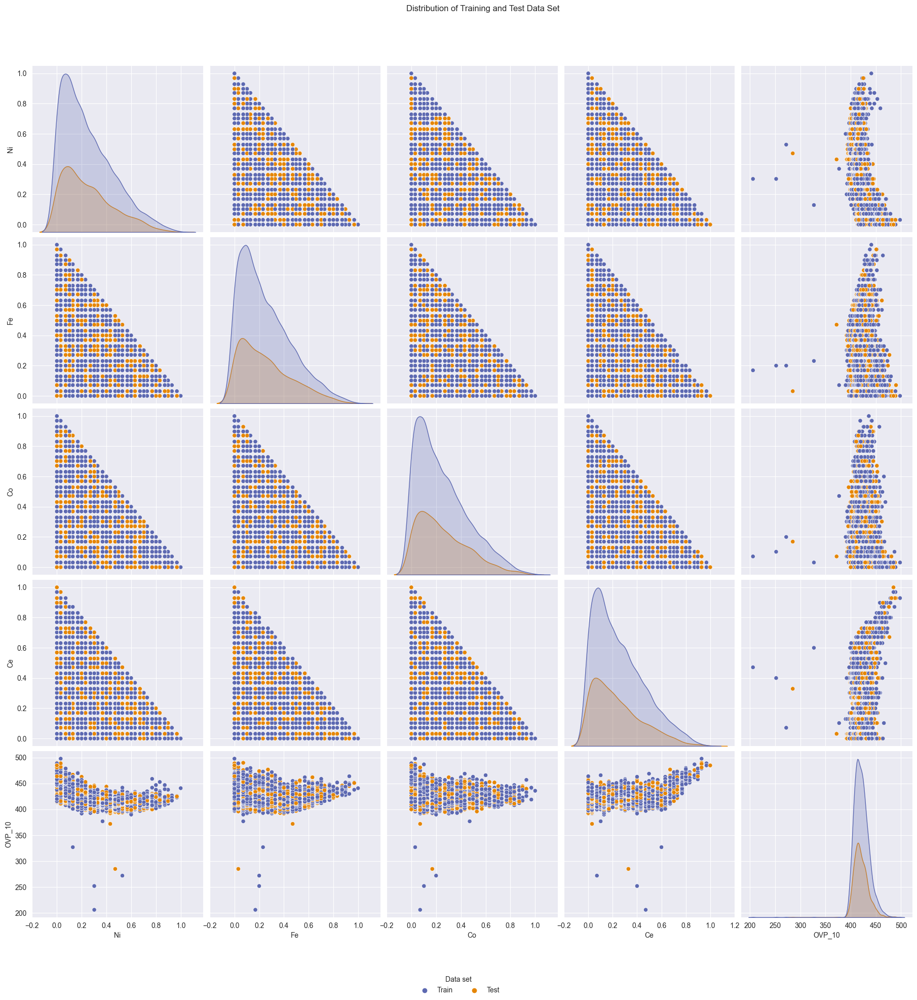

In [8]:
pal_set = [c['Train'], c['Test']]

sns.set_style('darkgrid')

g = sns.pairplot(df, hue="Set", palette=pal_set)
g._legend.remove()
handles = g._legend_data.values()
labels = g._legend_data.keys()
g.fig.legend(handles=handles, labels=labels, title='Data set', loc='lower center', ncol=2, frameon=False)
g.fig.subplots_adjust(top=0.92, bottom=0.08)
g.fig.suptitle('Distribution of Training and Test Data Set')
g.fig.set_size_inches(20,20)
plt.plot()

## Distribution of Experimental Data

In [9]:
import plotly.express as px

pal_elem = [c['Ni'], c['Fe'], c['Co'], c['Ce']]

fig = px.histogram(df, x=features, color_discrete_sequence=pal_elem)

# Update the layout for better visualization
fig.update_layout(
    title="Data Distribution of Representative Compositions of (Ni-Fe-Co-Ce)Ox catalysts",
    xaxis_title="Composition (percentage)",
    yaxis_title="Sample count",
    legend=dict(title="Element"),
    template="simple_white",
#     width=2000,
#     height=800,
)

fig.show()

In [10]:
# Calculate mean and standard deviation of 'target' column
mean_value = df[target].mean()
std_dev = df[target].std()

# Create the histogram
fig = px.histogram(df, x=target, color_discrete_sequence=[pal_plotly[2]])

# Update the layout for better visualization
fig.update_layout(
    title="Data Distribution of Overpotential Values",
    xaxis_title="Overpotential (mV at 10 mA cm−2)",
    yaxis_title="Sample count",
    showlegend=False,
    template="simple_white",
#     width=2000,
#     height=800,
)

out_left = float(mean_value.iloc[0]-3*std_dev.iloc[0])
out_right = float(mean_value.iloc[0]+3*std_dev.iloc[0])
print("Mean:", mean_value, ", std:", std_dev)
print("Outliers: Overpotential < %.4f, Overpotential > %.4f" % (out_left, out_right))

# out_left = np.percentile(df[target], 25)
# out_right = np.percentile(df[target], 75)
# print("1st Quartile: Overpotential < %d; 3rd Quartile: Overpotential > %d" % (out_left, out_right))

fig.add_trace(go.Scatter(x=[out_left, out_left],
                         y=[0, 200],
                         mode='lines',
                         line=dict(color='red', width=2, dash='dash'),
#                          name='<-3 STD'))
                         name='Q1'))
fig.add_trace(go.Scatter(x=[out_right, out_right],
                         y=[0, 200],
                         mode='lines',
                         line=dict(color='red', width=2, dash='dash'),
#                          name='>3 STD'))
                         name='Q3'))

fig.show()

Mean: OVP_10    421.113431
dtype: float64 , std: OVP_10    14.969446
dtype: float64
Outliers: Overpotential < 376.2051, Overpotential > 466.0218


In [11]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=1, cols=4, shared_yaxes=True, subplot_titles=features)

for i, (feature, color) in enumerate(zip(features, pal_elem)):
    hover_text = ("Ni: %{customdata[0]:.3f}<br>Fe: %{customdata[1]}<br>Co: %{customdata[2]}<br>Ce: %{customdata[3]}<br>OVP = %{y}<br>")
    fig.add_trace(go.Scatter(x=df[feature], y=df[target[0]], mode='markers', line_color=color,
                             hovertemplate=hover_text, customdata=df[features].values), 
                             row=1, col=i+1)

# Update the layout for better visualization
fig.update_layout(
    title="Representative Composition vs. Overpotential",
    xaxis_title="Composition (percentage)",
    yaxis_title="Overpotential (mV at 10 mA cm−2)",
    template="simple_white"
)

# Adjust the width and spacing between subplots
fig.update_layout(width=1200, height=400, showlegend=False)
# fig.update_layout(width=2000, height=600, showlegend=False)
# fig.update_traces(marker={'size': 8})

# Show the scatter plot
fig.show()


In [12]:
lowest_OVP = df.nsmallest(30, target)
lowest_OVP = lowest_OVP.drop(columns=['Set'])
print('Samples with the lowest overpotential:')
print(lowest_OVP)

fig_stacked_bars = go.Figure()

# Create a dictionary to keep track of features already added to the plot
added_features = {}

# Create the bar segments for each row
for idx, row in lowest_OVP.iterrows():
    segment_start = 0
    for feature, color in zip(features, pal_elem):
        segment_length = row[feature]

        fig_stacked_bars.add_trace(go.Bar(
            x=[segment_length],
            y=["(%d) %d"%(idx, row['OVP_10'])],
            orientation='h',
            name=f'{feature}',
            marker=dict(color=color),
            customdata=[f"{feature} = {segment_length:.3f}"],
            hovertemplate='%{customdata}',
            base=segment_start,
            legendgroup=f'{feature}',
            showlegend=False
        ))
        segment_start += segment_length

for feature, color in zip(features, pal_elem):
    fig_stacked_bars.add_trace(go.Scatter(
        x=[None],
        y=[None],
        mode='markers',
        marker=dict(color=color),
        name=f'{feature}',
        legendgroup=f'{feature}',
        showlegend=True,
        visible=True
    ))
    
# Update layout for the stacked bar plot
fig_stacked_bars.update_layout(
    title="Composition of Samples with the Lowest Overpotential",
    xaxis_title="Composition (percentage)",
    yaxis_title="Overpotential (mV at 10 mA cm−2)",
    # yaxis=dict(autorange="reversed"),
    barmode='stack',
    bargap=0.1,
    template="simple_white"
)

# fig_stacked_bars.update_layout(width=2000, height=800)

# Show the stacked bar plot
fig_stacked_bars.show()

Samples with the lowest overpotential:
         Ni     Fe     Co     Ce  OVP_10
3538  0.302  0.169  0.071  0.471     206
2883  0.302  0.200  0.102  0.400     252
2073  0.529  0.200  0.200  0.071     272
2031  0.471  0.031  0.169  0.329     285
4746  0.129  0.231  0.031  0.600     327
1305  0.431  0.471  0.071  0.031     372
3031  0.369  0.071  0.471  0.102     377
3671  0.600  0.071  0.200  0.129     390
290   0.431  0.400  0.169  0.000     392
1122  0.600  0.302  0.071  0.031     392
2977  0.200  0.102  0.302  0.400     392
291   0.431  0.369  0.200  0.000     393
1162  0.498  0.369  0.102  0.031     393
3670  0.600  0.102  0.169  0.129     393
3952  0.271  0.231  0.369  0.129     393
289   0.431  0.431  0.129  0.000     394
1151  0.529  0.231  0.200  0.031     394
1161  0.498  0.400  0.071  0.031     394
1210  0.498  0.329  0.129  0.031     394
1211  0.498  0.302  0.169  0.031     394
1212  0.498  0.271  0.200  0.031     394
3951  0.271  0.271  0.329  0.129     394
209   0.498  0.369

In [13]:
highest_OVP = df.nlargest(30, target)
highest_OVP = highest_OVP.drop(columns=['Set'])
print('Samples with the highest overpotential:')
print(highest_OVP)

fig_stacked_bars = go.Figure()

for idx, row in highest_OVP.iterrows():
    segment_start = 0
    for feature, color in zip(features, pal_elem):
        segment_length = row[feature]
        fig_stacked_bars.add_trace(go.Bar(
            x=[segment_length],
            y=["(%d) %d"%(idx, row['OVP_10'])],
            orientation='h',
            name=f'{feature}',
            marker=dict(color=color),
            customdata=[f"{feature} = {segment_length:.3f}"],
            hovertemplate='%{customdata}',
            base=segment_start,
            legendgroup=f'{feature}',
            showlegend=False
        ))
        segment_start += segment_length

for feature, color in zip(features, pal_elem):
    fig_stacked_bars.add_trace(go.Scatter(
        x=[None],
        y=[None],
        mode='markers',
        marker=dict(color=color),
        name=f'{feature}',
        legendgroup=f'{feature}',
        showlegend=True,
        visible=True
    ))
    
fig_stacked_bars.update_layout(
    title="Composition of Samples with the Highest Overpotential",
    xaxis_title="Composition (percentage)",
    yaxis_title="Overpotential (mV at 10 mA cm−2)",
    yaxis=dict(autorange="reversed"),
    barmode='stack',
    bargap=0.1,
    template="simple_white"
)

# fig_stacked_bars.update_layout(width=2000, height=800)

fig_stacked_bars.show()

Samples with the highest overpotential:
         Ni     Fe     Co     Ce  OVP_10
5405  0.031  0.000  0.031  0.929     498
5406  0.000  0.071  0.000  0.929     490
5409  0.031  0.000  0.000  0.969     489
5410  0.000  0.031  0.000  0.969     489
5407  0.000  0.031  0.031  0.929     488
5393  0.031  0.000  0.102  0.871     487
5411  0.000  0.000  0.031  0.969     485
5412  0.000  0.000  0.000  1.000     485
5404  0.031  0.031  0.000  0.929     482
5408  0.000  0.000  0.071  0.929     481
5345  0.031  0.129  0.031  0.800     480
5398  0.031  0.031  0.031  0.898     479
5403  0.071  0.000  0.000  0.929     479
5383  0.071  0.102  0.031  0.800     478
4952  0.071  0.271  0.000  0.671     477
5304  0.031  0.031  0.071  0.871     476
5309  0.071  0.071  0.000  0.871     476
5305  0.031  0.071  0.031  0.871     475
5338  0.000  0.129  0.071  0.800     475
5205  0.031  0.200  0.031  0.729     474
5212  0.000  0.231  0.031  0.729     473
5136  0.000  0.302  0.000  0.702     472
5317  0.000  0.12

In [14]:
# By Manuel Carrasco Yague
# https://stackoverflow.com/questions/67505252/plotly-box-p-value-significant-annotation
from scipy import stats

def add_p_value_annotation(fig, array_columns, subplot=None, _format=dict(interline=0.07, text_height=1.07, color='black')):
    ''' Adds notations giving the p-value between two box plot data (t-test two-sided comparison)
    
    Parameters:
    ----------
    fig: figure
        plotly boxplot figure
    array_columns: np.array
        array of which columns to compare 
        e.g.: [[0,1], [1,2]] compares column 0 with 1 and 1 with 2
    subplot: None or int
        specifies if the figures has subplots and what subplot to add the notation to
    _format: dict
        format characteristics for the lines

    Returns:
    -------
    fig: figure
        figure with the added notation
    '''
    # Specify in what y_range to plot for each pair of columns
    y_range = np.zeros([len(array_columns), 2])
    for i in range(len(array_columns)):
        y_range[i] = [1.01+i*_format['interline'], 1.02+i*_format['interline']]

    # Get values from figure
    fig_dict = fig.to_dict()

    # Get indices if working with subplots
    if subplot:
        if subplot == 1:
            subplot_str = ''
        else:
            subplot_str =str(subplot)
        indices = [] #Change the box index to the indices of the data for that subplot
        for index, data in enumerate(fig_dict['data']):
            #print(index, data['xaxis'], 'x' + subplot_str)
            if data['xaxis'] == 'x' + subplot_str:
                indices = np.append(indices, index)
        indices = [int(i) for i in indices]
        print((indices))
    else:
        subplot_str = ''

    # Print the p-values
    for index, column_pair in enumerate(array_columns):
        if subplot:
            data_pair = [indices[column_pair[0]], indices[column_pair[1]]]
        else:
            data_pair = column_pair

        # Mare sure it is selecting the data and subplot you want
        #print('0:', fig_dict['data'][data_pair[0]]['name'], fig_dict['data'][data_pair[0]]['xaxis'])
        #print('1:', fig_dict['data'][data_pair[1]]['name'], fig_dict['data'][data_pair[1]]['xaxis'])

        # Get the p-value
#         pvalue = stats.ttest_ind(
#             fig_dict['data'][data_pair[0]]['y'],
#             fig_dict['data'][data_pair[1]]['y'],
#             equal_var=False,
#         )[1]
        print("Computing Wilcoxon test with Bonferroni correction...")
        pvalue = stats.wilcoxon(
            fig_dict['data'][data_pair[0]]['y'],
            fig_dict['data'][data_pair[1]]['y'],
            correction=True,
        )[1]
        if pvalue >= 0.05:
            symbol = 'ns'
        elif pvalue >= 0.01: 
            symbol = '*'
        elif pvalue >= 0.001:
            symbol = '**'
        else:
            symbol = '***'
        # Vertical line
        fig.add_shape(type="line",
            xref="x"+subplot_str, yref="y"+subplot_str+" domain",
            x0=column_pair[0], y0=y_range[index][0], 
            x1=column_pair[0], y1=y_range[index][1],
            line=dict(color=_format['color'], width=2,)
        )
        # Horizontal line
        fig.add_shape(type="line",
            xref="x"+subplot_str, yref="y"+subplot_str+" domain",
            x0=column_pair[0], y0=y_range[index][1], 
            x1=column_pair[1], y1=y_range[index][1],
            line=dict(color=_format['color'], width=2,)
        )
        # Vertical line
        fig.add_shape(type="line",
            xref="x"+subplot_str, yref="y"+subplot_str+" domain",
            x0=column_pair[1], y0=y_range[index][0], 
            x1=column_pair[1], y1=y_range[index][1],
            line=dict(color=_format['color'], width=2,)
        )
        ## add text at the correct x, y coordinates
        ## for bars, there is a direct mapping from the bar number to 0, 1, 2...
        fig.add_annotation(dict(font=dict(color=_format['color'],size=14),
            x=(column_pair[0] + column_pair[1])/2,
            y=y_range[index][1]*_format['text_height'],
            showarrow=False,
            text=symbol,
            textangle=0,
            xref="x"+subplot_str,
            yref="y"+subplot_str+" domain"
        ))
    return fig

In [15]:
filter_ = df[target] > 0
filter_ = filter_.values.T[0]
filtered_df = df.loc[filter_]

fig = go.Figure()
for feature, color in zip(features, pal_elem):
    fig.add_trace(go.Box(y=filtered_df[feature].values, name=filtered_df[feature].name, fillcolor=color, line=dict(color='black', width=1)))

fig.update_layout(
    title="Distribution of Samples", title_y=0.95,
    margin=dict(t=140),
#     xaxis_title="Overpotential (mV at 10 mA cm−2)",
    yaxis_title="Composition (percentage)",
)

fig = add_p_value_annotation(fig, [[0,1], [0,2], [0,3], [1,2], [1,3], [2,3]])
# fig.update_layout(width=2000, height=800)

fig.show()

Computing Wilcoxon test with Bonferroni correction...
Computing Wilcoxon test with Bonferroni correction...
Computing Wilcoxon test with Bonferroni correction...
Computing Wilcoxon test with Bonferroni correction...
Computing Wilcoxon test with Bonferroni correction...
Computing Wilcoxon test with Bonferroni correction...


In [16]:
n = 395
filter_ = df[target] < n
filter_ = filter_.values.T[0]
filtered_df = df.loc[filter_]

fig = go.Figure()
for feature, color in zip(features, pal_elem):
    fig.add_trace(go.Box(y=filtered_df[feature].values, name=filtered_df[feature].name, fillcolor=color, line=dict(color='black', width=1)))

fig.update_layout(
    title="Distribution of Samples with Overpotential < %d" % n, title_y=0.95,
    margin=dict(t=140),
#     xaxis_title="Overpotential (mV at 10 mA cm−2)",
    yaxis_title="Composition (percentage)",
)

fig = add_p_value_annotation(fig, [[0,1], [0,2], [1,2], [2,3]])
# fig.update_layout(width=2000, height=800)

fig.show()

Computing Wilcoxon test with Bonferroni correction...
Computing Wilcoxon test with Bonferroni correction...
Computing Wilcoxon test with Bonferroni correction...
Computing Wilcoxon test with Bonferroni correction...


/Users/pdregonia/.pyenv/versions/3.10.10/lib/python3.10/site-packages/scipy/stats/_morestats.py:4088: UserWarning:

Exact p-value calculation does not work if there are zeros. Switching to normal approximation.



In [17]:
n = 465
filter_ = df[target] > n
filter_ = filter_.values.T[0]
filtered_df = df.loc[filter_]

fig = go.Figure()
for feature, color in zip(features, pal_elem):
    fig.add_trace(go.Box(y=filtered_df[feature].values, name=filtered_df[feature].name, fillcolor=color, line=dict(color='black', width=1)))

fig.update_layout(
    title="Distribution of Samples with Overpotential > %d" % n, title_y=0.95,
    margin=dict(t=140),
#     xaxis_title="Overpotential (mV at 10 mA cm−2)",
    yaxis_title="Composition (percentage)",
)

fig = add_p_value_annotation(fig, [[0,1], [0,2], [1,2], [1,3], [2,3]])
# fig.update_layout(width=2000, height=800)

fig.show()

Computing Wilcoxon test with Bonferroni correction...
Computing Wilcoxon test with Bonferroni correction...
Computing Wilcoxon test with Bonferroni correction...
Computing Wilcoxon test with Bonferroni correction...
Computing Wilcoxon test with Bonferroni correction...


/Users/pdregonia/.pyenv/versions/3.10.10/lib/python3.10/site-packages/scipy/stats/_morestats.py:4088: UserWarning:

Exact p-value calculation does not work if there are zeros. Switching to normal approximation.



# Modeling

In [18]:
from sklearn.model_selection import learning_curve, RandomizedSearchCV, GridSearchCV
from sklearn.ensemble import RandomForestRegressor

import pprint
import time
pp = pprint.PrettyPrinter(indent=1)

## Random Forest Regression

### Learning Curve

In [19]:
# Create a RandomForestRegressor
model = RandomForestRegressor(n_estimators=100)
# model = SVR(C=10, cache_size=200, coef0=0.0, degree=3, epsilon=0.001, gamma=10, kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=0)

# Create learning curve
start_time = time.time()
train_sizes, train_scores, test_scores = learning_curve(
    model, X_train, y_train, train_sizes=np.linspace(0.1, 1.0, 5), cv=5, scoring='r2', verbose=2,
)
end_time = time.time()
running_time = end_time - start_time
print('\nLearning Curve training time:', running_time, 's')

# Calculate mean and standard deviation of training and testing scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot the learning curve
fig = go.Figure()

fig.add_shape(
    type='rect',
    x0=train_sizes[0], y0=test_scores_mean[0] - test_scores_std[0],
    x1=train_sizes[-1], y1=test_scores_mean[-1] + test_scores_std[-1],
    line=dict(color='green', width=1.5, dash='dot'))

fig.add_trace(go.Scatter(x=train_sizes, y=train_scores_mean,
                         mode='lines+markers', marker={'size': 15, 'symbol':'triangle-up'},
                         line=dict(color=c['Train'], width=2),
                         name='Training score'))

fig.add_trace(go.Scatter(x=train_sizes, y=test_scores_mean,
                         mode='lines+markers', marker={'size': 10},
                         line=dict(color='green', width=2, dash='dash'),
                         name='Cross-validation score'))

fig.update_layout(title='Random Forest Regressor Learning Curve',
                  xaxis_title='Training examples',
                  yaxis_title='R2',
                  legend=dict(x=1.02, y=1),
                  legend_title_text='Scores')


fig.update_layout(width=2000, height=800)

fig.show()

[learning_curve] Training set sizes: [ 303  985 1667 2349 3031]
[CV] END .................................................... total time=   0.2s
[CV] END .................................................... total time=   0.3s
[CV] END .................................................... total time=   0.4s
[CV] END .................................................... total time=   0.5s
[CV] END .................................................... total time=   0.7s
[CV] END .................................................... total time=   0.2s
[CV] END .................................................... total time=   0.3s
[CV] END .................................................... total time=   0.4s
[CV] END .................................................... total time=   0.5s
[CV] END .................................................... total time=   0.6s
[CV] END .................................................... total time=   0.2s
[CV] END ....................................

### Machine Learning with Hyperparameter Optimization

*Note: do not rerun*

In [21]:
## Tune hyperparameters
# import caffeine

# Define hyperparameter space
n_estimators = [100, 250, 500, 1000]
max_features = [1, 2, 3, 4]
max_depth = [int(x) for x in np.linspace(10, 100, num=10)]
max_depth.append(None)
min_samples_split = [2, 5, 10, 15]
min_samples_leaf = [1, 2, 4, 6]
bootstrap = [True, False]
cv = 10

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

print('Hyperparameter search space')
pp.pprint(random_grid)

# Set the hyperparameter tuner
start_time = time.time()
model = RandomForestRegressor(verbose=0)
tuner = RandomizedSearchCV(estimator=model, param_distributions=random_grid, n_iter=3000, cv=5, scoring='r2', 
                           random_state=random_state, verbose=1, return_train_score=True, n_jobs=10)
print('\nCross-validation via', tuner)
# tuner = GridSearchCV(estimator=model, param_grid=random_grid, cv=cv, scoring='r2', 
#                      verbose=6, return_train_score=True, n_jobs=10)

# Fit the random search model
# tuner.fit(X_train, y_train)
# end_time = time.time()
# running_time = end_time - start_time
# print('\nRandom Forest training time:', running_time, 's')

Hyperparameter search space
{'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None],
 'max_features': [1, 2, 3, 4],
 'min_samples_leaf': [1, 2, 4, 6],
 'min_samples_split': [2, 5, 10, 15],
 'n_estimators': [100, 250, 500, 1000]}

Cross-validation via RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_iter=3000,
                   n_jobs=10,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, None],
                                        'max_features': [1, 2, 3, 4],
                                        'min_samples_leaf': [1, 2, 4, 6],
                                        'min_samples_split': [2, 5, 10, 15],
                                        'n_estimators': [100, 250, 500, 1000]},
                   random_state=42, return_train_score=True, scoring='r2',
           

In [ ]:
# ## Check the tuned model
# print('Best hyperparameters:')
# print(tuner.best_estimator_)

In [ ]:
## Save the model
# model_name = type(tuner).__name__
# file_name = model_name + '_' + time.strftime("%Y%m%d-%H%M%S") + '.mod'
# file_save = 'models/' + file_name

# print('Saving', model_name, 'model as', file_name, '...')
# job.dump(tuner, file_save) 

In [22]:
# Load the model
file_model = 'RandomizedSearchCV_20230727-032042.mod'
file_load = 'models/' + file_model

saved_model = job.load(file_load) 
tuner = saved_model

print('Best hyperparameters:')
pp.pprint(tuner.best_estimator_.get_params())

Best hyperparameters:
{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 2,
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}


### Cross-validation Results

{'n_estimators': [100, 250, 500, 1000], 'max_features': [1, 2, 3, 4], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None], 'min_samples_split': [2, 5, 10, 15], 'min_samples_leaf': [1, 2, 4, 6], 'bootstrap': [True, False]}
n_estimators = 100 : 0.7455534643751459
n_estimators = 250 : 0.7472015482277106
n_estimators = 500 : 0.7450422407885889
n_estimators = 1000 : 0.7459038177020687
max_features = 1 : 0.753479672707455
max_features = 2 : 0.7590758297554914
max_features = 3 : 0.7530515547774407
max_features = 4 : 0.7176985706998085
max_depth = 10 : 0.7447193849297684
max_depth = 20 : 0.7479306440230411
max_depth = 30 : 0.7463178503686366
max_depth = 40 : 0.7446414499206708
max_depth = 50 : 0.7486585044111222
max_depth = 60 : 0.7424621138039025
max_depth = 70 : 0.7464154872358476
max_depth = 80 : 0.7438427603576013
max_depth = 90 : 0.7456698259128873
max_depth = 100 : 0.7453419920630296
max_depth = None : 0.7489970803371158
min_samples_split = 2 : 0.7409867658933624
min_samples_spl

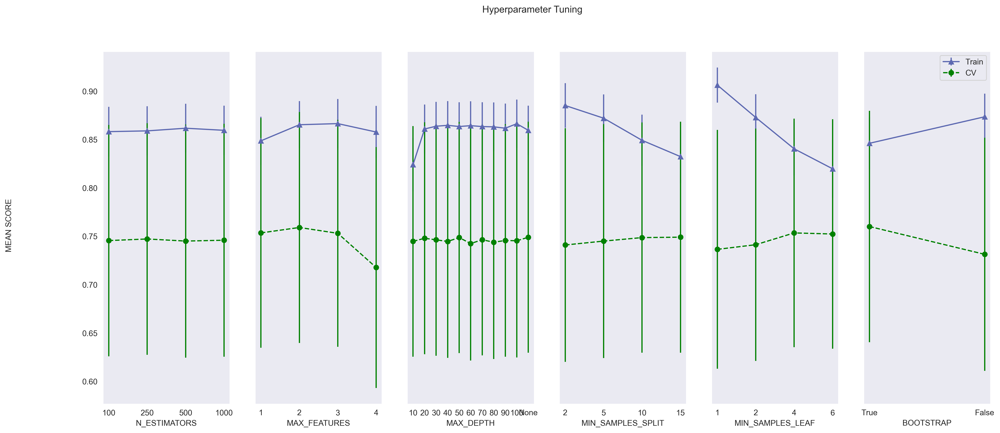

In [23]:
## Plot CV results
def plot_cv(tuner):
    results = tuner.cv_results_
    cv_params = tuner.param_distributions
    means_test = results['mean_test_score']
    stds_test = results['std_test_score']
    means_train = results['mean_train_score']
    stds_train = results['std_train_score']

    print(cv_params)
    fig, ax = plt.subplots(1, len(cv_params), sharex='none', sharey='all', figsize=(20,8), dpi=300)
    fig.suptitle('Hyperparameter Tuning')
    fig.text(0.04, 0.5, 'MEAN SCORE', va='center', rotation='vertical')

    scores = {}
    for i, (param, param_val) in enumerate(cv_params.items()):
        x, y1, e1, y2, e2 = [], [], [], [], []

        for v in param_val:
            mask_idx = results['param_'+param]==v
            v = str(v)

            m_train = np.mean(means_train[mask_idx])
            s_train = np.sqrt(np.mean(stds_train[mask_idx]**2))
            m_test = np.mean(means_test[mask_idx])    
            s_test = np.sqrt(np.mean(stds_test[mask_idx]**2))

            scores[param+'='+v+'_means_train'] = m_train
            scores[param+'='+v+'_stds_train'] = s_train    
            scores[param+'='+v+'_means_test'] = m_test
            scores[param+'='+v+'_stds_test'] = s_test
            print(param, "=", v, ":", m_test)

            x.append(v)
            y1.append(m_train)
            e1.append(s_train) 
            y2.append(m_test) 
            e2.append(s_test)

        ax[i].errorbar(x, y1, e1, linestyle='-', marker='^', color=c['Train'], label='Train')
        ax[i].errorbar(x, y2, e2, linestyle='--', marker='o', color='g', label='CV')
        ax[i].set_xlabel(param.upper())

    # pp.pprint(scores)

    plt.legend()
    plt.show()

sns.set_style('dark')
plot_cv(tuner)
# print(tuner.cv_results_)
# plot_cv(saved_model)

## Model Testing

In [24]:
## Evaluate model
import sklearn.metrics as metrics

def evaluate(model, X, y_actual):
    y_predicted = model.predict(X)
    mae = metrics.mean_absolute_error(y_actual, y_predicted)
    mse = metrics.mean_squared_error(y_actual, y_predicted)
    rmse = np.sqrt(mse)
    re = np.divide(np.abs(y_actual - y_predicted), y_actual) * 100
    mre = np.mean(re)
    r2 = model.score(X, y_actual)

    print('Model Performance')
    print('MAE: {:0.4f}'.format(mae))
    print('MSE: {:0.4f}'.format(mse))
    print('RMSE: {:0.4f}'.format(rmse))
    print('MRE: {:0.4f}%'.format(mre))
    print('R2: {:0.4f}'.format(r2))
    
    return r2

print('Base model')
base_model = RandomForestRegressor(random_state=random_state)
base_model.fit(X_train, y_train)
base_accuracy = evaluate(base_model, X_test, y_test)

print('\nTuned model')
tuned_model = tuner.best_estimator_
tuned_accuracy = evaluate(tuned_model, X_test, y_test)

# print('\nSaved model')
# saved_accuracy = evaluate(saved_model.best_estimator_, X_test, y_test)

print('\nImprovement: {:0.2f}'.format(tuned_accuracy - base_accuracy))

Base model
Model Performance
MAE: 3.9651
MSE: 40.5839
RMSE: 6.3705
MRE: 0.9466%
R2: 0.8056

Tuned model
Model Performance
MAE: 3.9443
MSE: 37.1339
RMSE: 6.0938
MRE: 0.9421%
R2: 0.8221

Improvement: 0.02


### Prediction Error

Train R2: 0.8868
Test R2: 0.8221



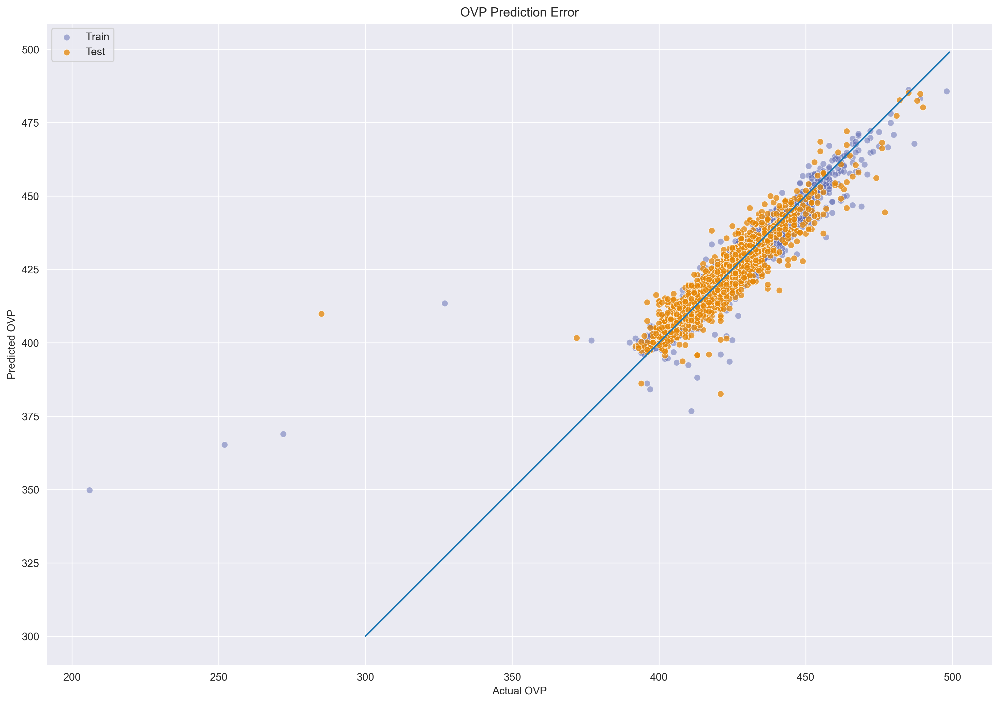

In [25]:
## Predict the test set
model = tuned_model
# model = base_model
y_predict = model.predict(X_test)
y_predict_train = model.predict(X_train)

print("Train R2: %.4f" % model.score(X_train, y_train))
print("Test R2: %.4f\n" % model.score(X_test, y_test))

# Plot predicted vs actual
sns.set_style("darkgrid")

fig = plt.figure(figsize=(16, 12), dpi=300)
ax = fig.add_subplot(111, aspect=1)
sns.scatterplot(x=y_train, y=y_predict_train, label='Train', color=c['Train'], alpha=0.5)
sns.scatterplot(x=y_test, y=y_predict, label='Test', color=c['Test'], alpha=0.75)
plt.plot(range(300,500), range(300,500))

plt.xlabel("Actual OVP")
plt.ylabel("Predicted OVP")
plt.title("OVP Prediction Error")

plt.show()

In [26]:
import plotly.express as px
import plotly.graph_objects as go

# Predict the test set
model = tuned_model
# model = base_model
y_predict = model.predict(X_test)
y_predict_train = model.predict(X_train)

print("Train R2: %.4f" % model.score(X_train, y_train))
print("Test R2: %.4f\n" % model.score(X_test, y_test))

# Create scatter plot
fig = go.Figure()

# hover_text = ("Ni: %{customdata[0]:.3f}<br>Fe: %{customdata[1]}<br>Co: %{customdata[2]}<br>Ce: %{customdata[3]}<br>OVP = %{y}<br>")
fig.add_trace(go.Scatter(
    x=y_train,
    y=y_predict_train,
    mode='markers',
    name='Train',
#     hovertemplate=hover_text,
#     customdata=df[features].values)
    marker=dict(color='rgba(31, 119, 180, 0.5)')
))

fig.add_trace(go.Scatter(
    x=y_test,
    y=y_predict,
    mode='markers',
    name='Test',
    marker=dict(color='rgba(255, 127, 14, 0.75)')
))

# Add diagonal line
fig.add_trace(go.Scatter(
    x=[300, 500],
    y=[300, 500],
    mode='lines',
    name='Diagonal Line',
    line=dict(color='rgba(44, 160, 44, 0.5)')
))

fig.update_layout(
    title="OVP Prediction Error",
    xaxis_title="Actual OVP",
    yaxis_title="Predicted OVP",
    showlegend=True,
    legend=dict(x=1, y=1),
    height=600,
    width=800,
    plot_bgcolor='white'
)

fig.show()

Train R2: 0.8868
Test R2: 0.8221



## Residuals

/Users/pdregonia/.pyenv/versions/3.10.10/lib/python3.10/site-packages/sklearn/base.py:464: UserWarning:

X does not have valid feature names, but RandomForestRegressor was fitted with feature names



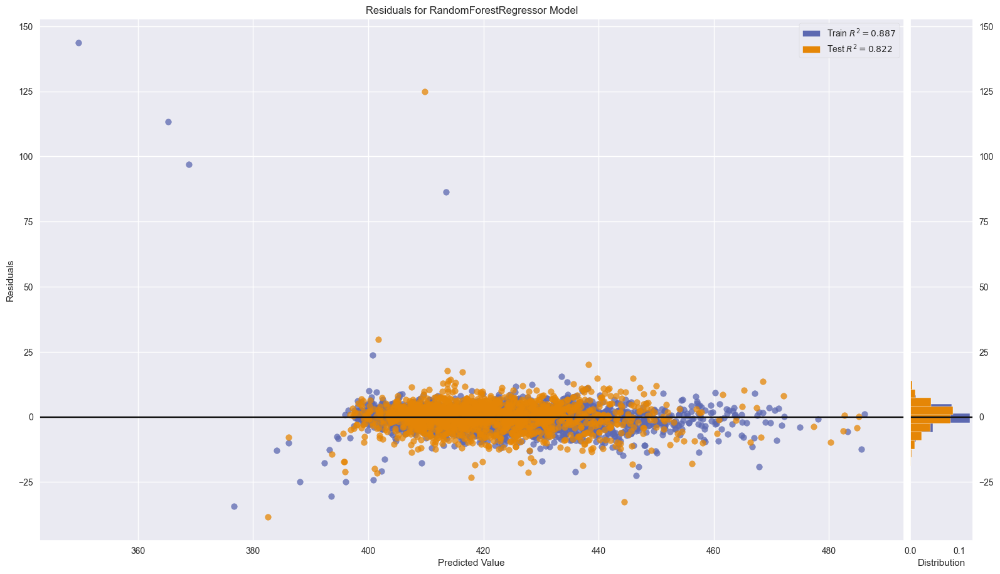

<Axes: title={'center': 'Residuals for RandomForestRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [27]:
import yellowbrick as yb
from yellowbrick.regressor import ResidualsPlot

sns.set_style('darkgrid')
visualizer = ResidualsPlot(model, hist='density', qqplot=False,
                           train_color=c['Train'], test_color=c['Test'], size=(1920, 1080), dpi=300)

visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
visualizer.show()                 # Finalize and render the figure
# plt.show()

# Model Explanation

## Shapley Additive Explanations

Shapley Additive Explanations (or SHAP) is a [unified framework](https://dl.acm.org/doi/10.5555/3295222.3295230) for creating explainable AI models (XAI).

SHAP values quantify the [contribution](https://towardsdatascience.com/shap-explained-the-way-i-wish-someone-explained-it-to-me-ab81cc69ef30) of a feature to the target value. The bigger the contribution is, the higher the SHAP value becomes.

In [28]:
import shap
import tqdm.auto

# Calculate SHAP
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train)
shap_test_values = explainer.shap_values(X_test)

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


## Feature Importance

Graph shows that Ni has the highest SHAP value among all of the features, and thus has most impact on predicting overpotential of (Ni-Fe-Co-Ce)Ox catalysts.

On the other hand, Fe has the least impact.

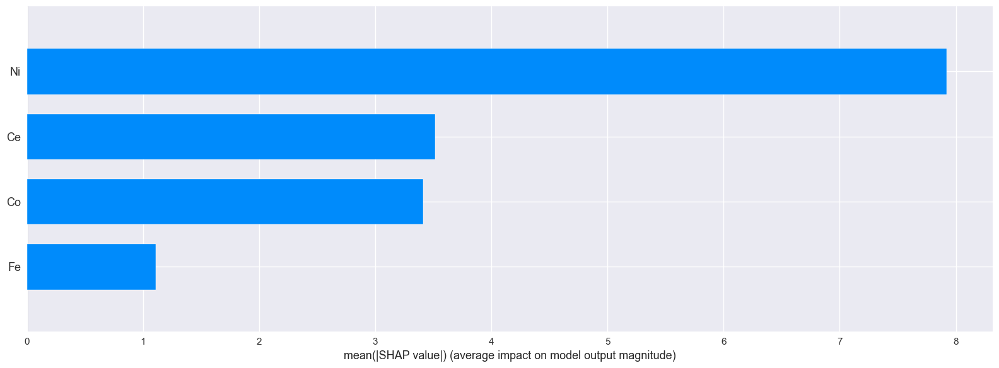

In [51]:
shap.summary_plot(shap_values, X_train, feature_names=features, plot_type="bar", plot_size=[16,6])

## Feature Effects

In this graph, each point corresponds to a sample in the training set.

Notice how most of the high-valued Ni samples have larger albeit negative impact to OVP (model output)? This tells us that Ni has an inverse effect on OVP.

Comparing this to Ce, we can observe that Ce has a positive effect on OVP, i.e., higher Ce means higher OVP.

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


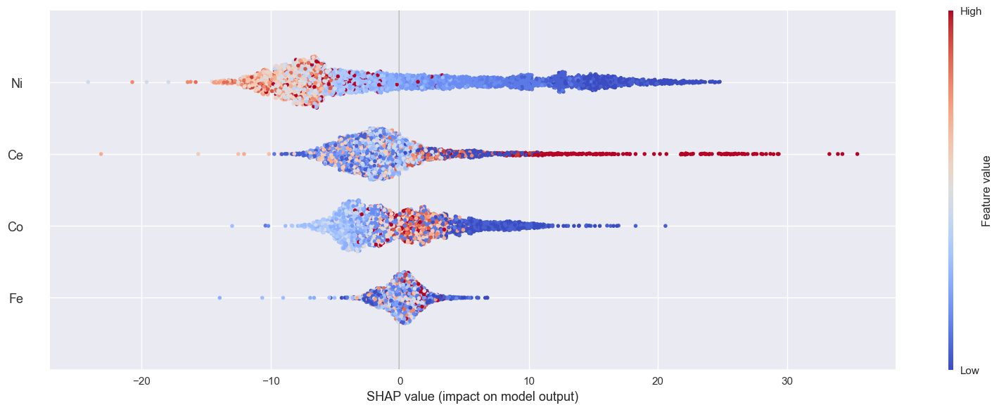

In [30]:
shap.summary_plot(shap_values, X_train, feature_names=features, cmap='coolwarm', plot_size=[16,6])

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


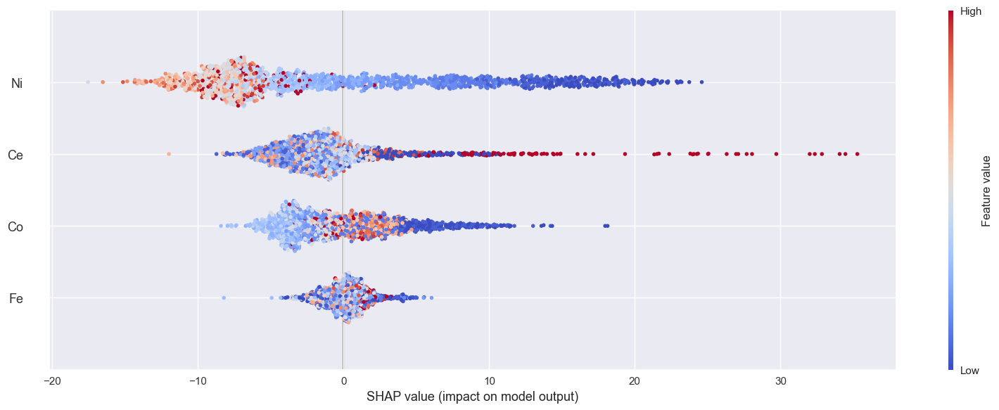

In [31]:
shap.summary_plot(shap_test_values, X_test, feature_names=features, cmap='coolwarm', plot_size=[16,6])

## Dependence

The next plot is called a dependence plot, and it shows how the model depends on each feature.

We can interpret the plot as [follows](https://shap-lrjball.readthedocs.io/en/latest/example_notebooks/plots/dependence_plot.html):
* Each dot is a single sample from the dataset.
* The x-axis is the actual feature value from the dataset.
* The y-axis is the SHAP feature value, which represents how much knowing that feature value changes the output of the model for that sample.
* The color corresponds to a second feature that may have an interaction effect with the feature we are plotting (by default this second feature is chosen automatically). If an interaction effect is present between this other feature and the feature we are plotting, it will show up as a distinct vertical pattern of coloring.

<br>

From this figure, we can observe the following:
* Ni has high SHAP values at lower range (0-0.2), which means lower Ni could help in predicting OVP
* Ce has high SHAP values at higher range (0.8-10), which means higher Ce could help in predicting OVP

In [32]:
print('Interaction values')
shap_interaction_values = explainer.shap_interaction_values(X_test)
print(shap_interaction_values)

Interaction values
[[[-8.48009594e+00 -1.78512148e+00 -9.05635037e-01 -2.90712134e+00]
  [-1.78512148e+00  6.21235052e-01 -8.73899797e-01 -1.46561730e+00]
  [-9.05635037e-01 -8.73899797e-01 -3.11654733e+00 -3.67633256e-02]
  [-2.90712134e+00 -1.46561730e+00 -3.67633256e-02  4.39780919e+00]]

 [[ 1.53671656e+00  8.59957560e-01  6.44131469e-01 -1.23759267e+00]
  [ 8.59957560e-01 -1.19562845e-01 -1.27806085e-02  5.06993655e-01]
  [ 6.44131469e-01 -1.27806085e-02 -4.15507319e+00  2.65311210e-01]
  [-1.23759267e+00  5.06993655e-01  2.65311210e-01 -4.99183067e-02]]

 [[ 6.05127535e+00 -1.90450524e+00  1.05948609e-01 -2.69527195e+00]
  [-1.90450524e+00  1.42362879e+00 -1.44171364e-01  1.11179362e+00]
  [ 1.05948609e-01 -1.44171364e-01 -4.57522289e+00 -9.74698662e-01]
  [-2.69527195e+00  1.11179362e+00 -9.74698662e-01  1.85316550e+00]]

 ...

 [[-9.95812557e+00 -4.84210789e-01  7.64016388e-01  2.61925940e+00]
  [-4.84210789e-01 -3.77327246e-01 -1.83783664e-01  5.00741852e-01]
  [ 7.64016388e-0

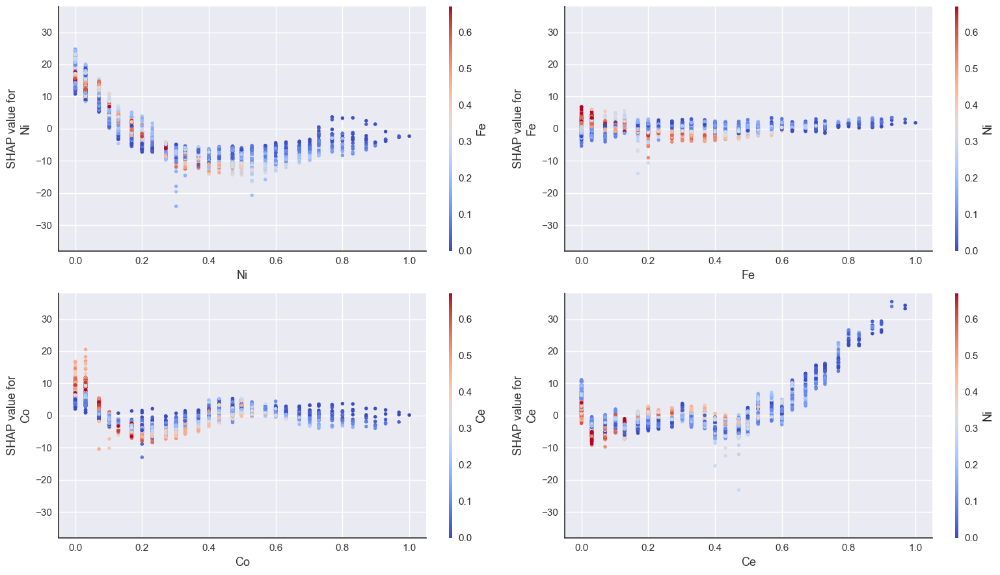

In [70]:
sns.set_style('darkgrid')
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 9))
axes = axes.ravel()

for i, feat in enumerate(features):
    shap.dependence_plot(feat, shap_values, X_train, ax=axes[i], show=False, cmap='coolwarm')
    # shap.dependence_plot(feat, shap_test_values, X_test, ax=axes[i], show=False, cmap='coolwarm')
#     shap.dependence_plot(feat, shap_interaction_values, X_test, ax=axes[i], show=False, cmap='coolwarm')    

plt.setp(axes, ylim=(-38, 38), xlim=(-0.05, 1.05))

fig.tight_layout()
plt.savefig('dep-all', dpi=300)
plt.show()

In [40]:
features[0]

'Ni'

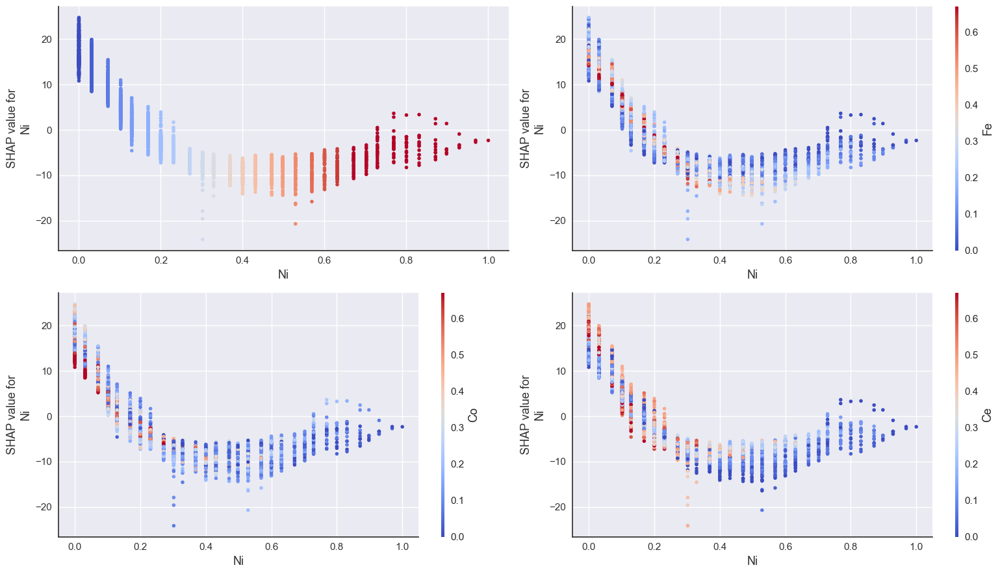

In [71]:
sns.set_style('darkgrid')
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 9))
axes = axes.ravel()

for i, feat in enumerate(features):
  shap.dependence_plot(features[0], shap_values, X_train, interaction_index=feat, ax=axes[i], show=False, cmap='coolwarm')

fig.tight_layout()
plt.savefig('dep-ni', dpi=300)
plt.show()

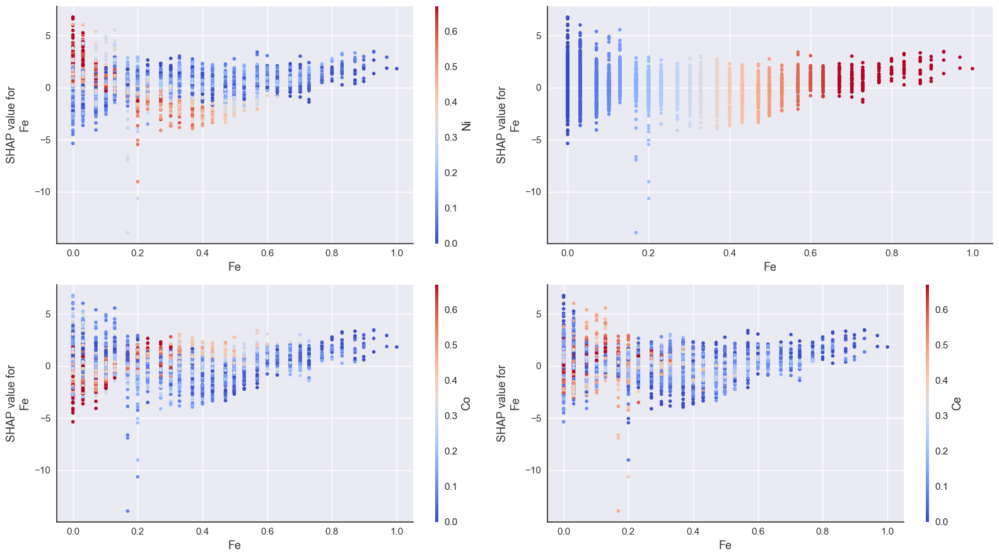

In [72]:
sns.set_style('darkgrid')
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 9))
axes = axes.ravel()

for i, feat in enumerate(features):
  shap.dependence_plot(features[1], shap_values, X_train, interaction_index=feat, ax=axes[i], show=False, cmap='coolwarm')

fig.tight_layout()
plt.savefig('dep-fe', dpi=300)
plt.show()

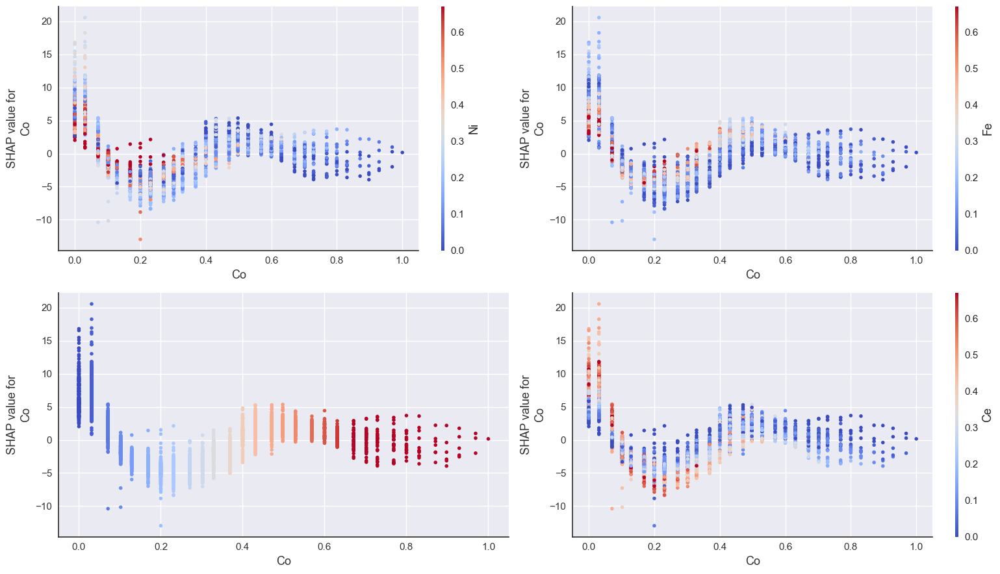

In [73]:
sns.set_style('darkgrid')
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 9))
axes = axes.ravel()

for i, feat in enumerate(features):
  shap.dependence_plot(features[2], shap_values, X_train, interaction_index=feat, ax=axes[i], show=False, cmap='coolwarm')

fig.tight_layout()
plt.savefig('dep-co', dpi=300)
plt.show()

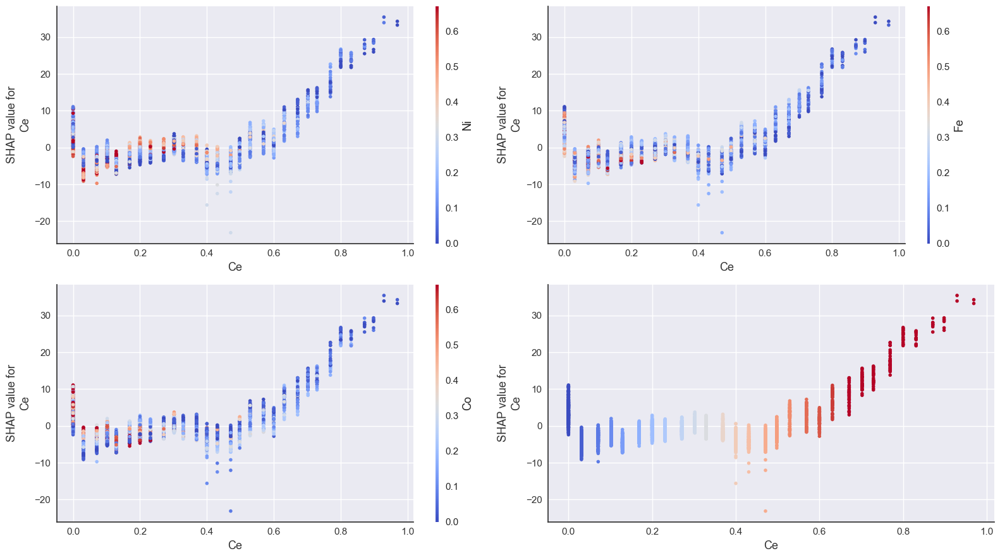

In [74]:
sns.set_style('darkgrid')
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 9))
axes = axes.ravel()

for i, feat in enumerate(features):
  shap.dependence_plot(features[3], shap_values, X_train, interaction_index=feat, ax=axes[i], show=False, cmap='coolwarm')

fig.tight_layout()
plt.savefig('dep-ce', dpi=300)
plt.show()

## Additive Force

The following plot is called a Force Plot that shows how the features influence the prediction of OVP.

Suppose we pick a random sample from the test set with experimental features:
Ni=0.129, Ce=0.129, Co=0.169, Fe=0.569

We start by looking at the base prediction (OVP=421.33).
From the base value, we see that Ce, Co, and Fe pull the base value to the left (negative force), while Ni pushes it to the right (positive force), which adds up to a net "force" of -5.29.

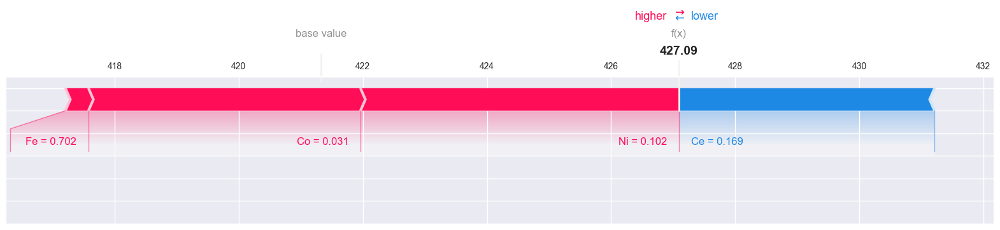

Sample: Ni    0.102
Fe    0.702
Co    0.031
Ce    0.169
Name: 4803, dtype: float64

SHAP Expected value: 421.33
Actual value: 427.00
Predicted value: 427.09


In [34]:
i = 0 # random sample
shap.force_plot(explainer.expected_value, shap_values[i], X_train.iloc[i], feature_names=features,
                matplotlib=True)

print("Sample:", X_train.iloc[i])
print("\nSHAP Expected value: %.2f" % explainer.expected_value)
print("Actual value: %.2f" % y_train[i])
print("Predicted value: %.2f" % tuned_model.predict(pd.DataFrame(X_train.iloc[i]).T))

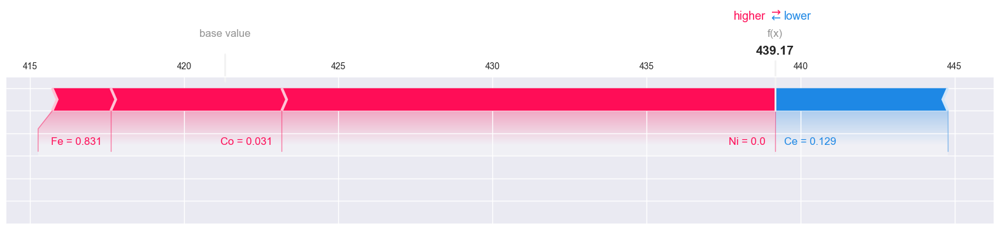

Sample: Ni    0.000
Fe    0.831
Co    0.031
Ce    0.129
Name: 4161, dtype: float64

SHAP Expected value: 421.33
Actual value: 441.00
Predicted value: 439.17


In [35]:
# np.random.seed(random_state)
i = np.random.randint(len(X_test))

shap.force_plot(explainer.expected_value, shap_test_values[i], X_test.iloc[i], feature_names=features,
                matplotlib=True)

print("Sample:", X_test.iloc[i])
print("\nSHAP Expected value: %.2f" % explainer.expected_value)
print("Actual value: %.2f" % y_test[i])
print("Predicted value: %.2f" % tuned_model.predict(pd.DataFrame(X_test.iloc[i]).T))

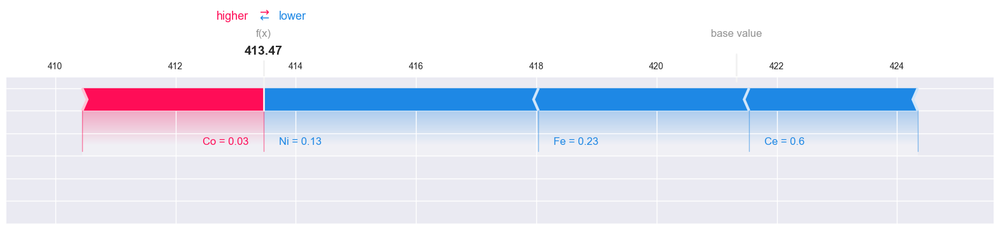

Sample:      Ni    Fe    Co   Ce
0  0.13  0.23  0.03  0.6

SHAP Expected value: 421.33
Predicted value: 413.47
Actual value: 327.00


In [36]:
## Try SHAP Explainer on unknown sample
ni = 0.13
fe = 0.23
co = 0.03
ce = 0.60
y_true = 327
# ce = 1-(ni+fe+co)

# assert ce > 0, "Composition exceeds 100%"

new_sample = pd.DataFrame({'Ni':[ni], 'Fe':[fe], 'Co':[co], 'Ce':[ce]})

shap_new_value = explainer.shap_values(new_sample)
shap.force_plot(explainer.expected_value, shap_new_value, new_sample, feature_names=features,
                matplotlib=True)

print("Sample:", new_sample)
print("\nSHAP Expected value: %.2f" % explainer.expected_value)
print("Predicted value: %.2f" % tuned_model.predict(new_sample))
print("Actual value: %.2f" % y_true)

## Random Forest Visualization

In [37]:
# By Piotr Płoński
# https://mljar.com/blog/visualize-tree-from-random-forest/
import dtreeviz
from sklearn import tree

plt.figure(figsize=(100,100))
tree.plot_tree(model.estimators_[0], feature_names=features, filled=True, fontsize=6)
plt.savefig('models/tree_high_dpi', dpi=100)

In [38]:
print(model.get_params())

{'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': 2, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 2, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}
